# AnoGAN 논문 구현  
- pytorch

## Packages and Modules

In [1]:
import os
import random
import time
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFile
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchsummary import summary

In [2]:
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## GPU device

In [5]:
device = torch.device('cuda')
print(device)

cuda


## Load data and preprocessing

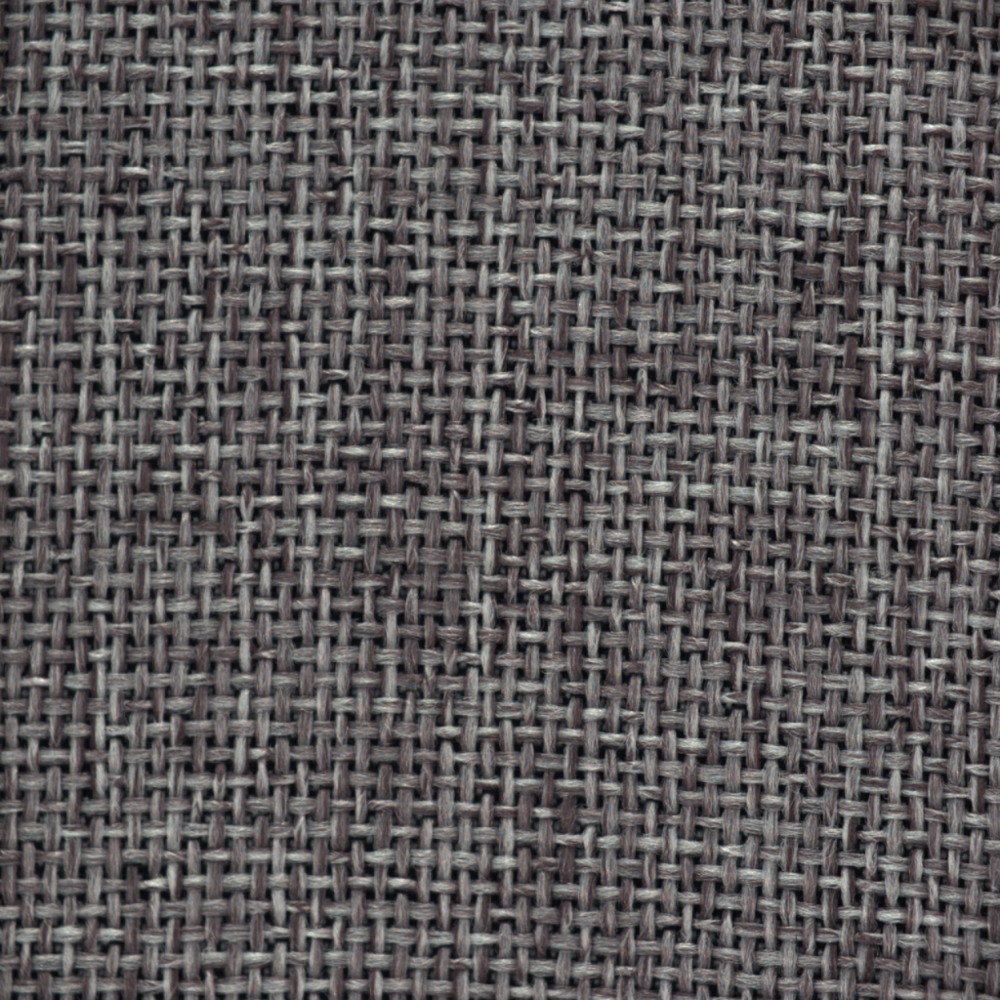

In [6]:
path = r'C:\Users\user\MY_DL\GAN\AnoGAN\anogan_carpet\train\good\000.png'
Image.open(path)

In [7]:
latent_dim = 128
batch_size = 16
lr = 0.0002
target_size = (64,64)

In [8]:
# custom dataset
class ImageDataset(Dataset):
    def __init__(self, path, transforms_):
        self.transform = transforms.Compose(transforms_)
        self.files = glob.glob(path+'/**/*.png')
        
    def __getitem__(self, index):
        img = Image.open(self.files[index%len(self.files)])
        img = self.transform(img)
        return img
    
    def __len__(self):
        return len(self.files)

In [9]:
path = './anogan_carpet/train'

transforms_ = [
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,)),
    transforms.Resize(target_size)
]

dataloader = DataLoader(
    ImageDataset(path, transforms_=transforms_),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)

### Build Models

In [10]:
class Generator(nn.Module):
    def __init__(self, latent_dim=128, num_filters=32, out_channel=1):
        super(Generator, self).__init__()
        self.g_model = nn.Sequential(
            # input size is 128x1x1
            nn.ConvTranspose2d(latent_dim, num_filters*8, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(num_filters*8),
            nn.ReLU(),
            # output size is 256x4x4
        
            nn.ConvTranspose2d(num_filters*8, num_filters*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU(),
            # output size is 128x8x8
        
            nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU(),
            # output size is 64x16x16
            
            nn.ConvTranspose2d(num_filters*2, num_filters, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(),
            # output size is 32x32x32
        
            nn.ConvTranspose2d(num_filters, out_channel, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
            # output size is 1x64x64
        )
        
    def forward(self, x):
        return self.g_model(x)

In [11]:
# generator summary
g_model = Generator().to(device)
summary(g_model, (128,1,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 256, 4, 4]         524,544
       BatchNorm2d-2            [-1, 256, 4, 4]             512
              ReLU-3            [-1, 256, 4, 4]               0
   ConvTranspose2d-4            [-1, 128, 8, 8]         524,416
       BatchNorm2d-5            [-1, 128, 8, 8]             256
              ReLU-6            [-1, 128, 8, 8]               0
   ConvTranspose2d-7           [-1, 64, 16, 16]         131,136
       BatchNorm2d-8           [-1, 64, 16, 16]             128
              ReLU-9           [-1, 64, 16, 16]               0
  ConvTranspose2d-10           [-1, 32, 32, 32]          32,800
      BatchNorm2d-11           [-1, 32, 32, 32]              64
             ReLU-12           [-1, 32, 32, 32]               0
  ConvTranspose2d-13            [-1, 1, 64, 64]             513
             Tanh-14            [-1, 1,

In [12]:
class Discriminator(nn.Module):
    def __init__(self, in_dim=1, num_filters=32):
        super(Discriminator, self).__init__()
        self.feature_layer = nn.Sequential(
            # input size is 1x64x64
            nn.Conv2d(in_dim, num_filters, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 32x32x32
            
            nn.Conv2d(num_filters, num_filters*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*2),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 64x16x16
            
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*4),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 128x8x8
            
            nn.Conv2d(num_filters*4, num_filters*8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*8),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 256x4x4
        )
        self.out_layer = nn.Sequential(
            nn.Conv2d(num_filters*8, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
            # output size is 1x1x1
        )
        
    def extract_feature(self, x):
        return self.feature_layer(x)
    
    def forward(self, x):
        x = self.feature_layer(x)
        out = self.out_layer(x)
        return out.view(-1,1)

In [13]:
# discriminator summary
d_model = Discriminator().to(device)
summary(d_model, (1,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 32, 32]             544
       BatchNorm2d-2           [-1, 32, 32, 32]              64
         LeakyReLU-3           [-1, 32, 32, 32]               0
            Conv2d-4           [-1, 64, 16, 16]          32,832
       BatchNorm2d-5           [-1, 64, 16, 16]             128
         LeakyReLU-6           [-1, 64, 16, 16]               0
            Conv2d-7            [-1, 128, 8, 8]         131,200
       BatchNorm2d-8            [-1, 128, 8, 8]             256
         LeakyReLU-9            [-1, 128, 8, 8]               0
           Conv2d-10            [-1, 256, 4, 4]         524,544
      BatchNorm2d-11            [-1, 256, 4, 4]             512
        LeakyReLU-12            [-1, 256, 4, 4]               0
           Conv2d-13              [-1, 1, 1, 1]           4,097
          Sigmoid-14              [-1, 

In [14]:
# weight 초기화
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(model.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(model.weight, 1.0, 0.02)
        torch.nn.init.zeros_(model.bias)

In [15]:
# assign gpu operation
generator = Generator().to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (feature_layer): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (out_layer): Sequential(
    (0): Conv2d(256, 1, kernel_size=(4, 4), strid

## Set losses and optimizers

In [16]:
# set loss function and optimizer
gen_optim = optim.Adam(generator.parameters(), lr=lr, weight_decay=1e-5, betas=(0.5,0.999))
dis_optim = optim.Adam(discriminator.parameters(), lr=lr, weight_decay=1e-5, betas=(0.5,0.999))

loss_func = nn.BCELoss().to(device)

## Train DCGAN

In [17]:
# define function for showing generated images
def plot_generated_images(fake_images, epoch, every):
    if epoch%every==0:
        plt.figure(figsize=(15,5))
        images = np.transpose(vutils.make_grid(fake_images.to(device), 
                                               padding=3, 
                                               normalize=True).cpu(), (1,2,0))
        plt.imshow(images)
        plt.axis('off')
        plt.show()

In [18]:
# set epochs
n_epochs = 100

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100, time: 9.52400016784668s
Discriminator loss: 2.4373302459716797, Generator loss: 0.06355464458465576
--------------------------------------------------------------------------------
Epoch 2/100, time: 9.205008506774902s
Discriminator loss: 2.252821445465088, Generator loss: 0.1433064341545105
--------------------------------------------------------------------------------
Epoch 3/100, time: 9.201003551483154s
Discriminator loss: 1.8353415727615356, Generator loss: 0.3956621289253235
--------------------------------------------------------------------------------
Epoch 4/100, time: 9.164000988006592s
Discriminator loss: 2.3232760429382324, Generator loss: 0.44410496950149536
--------------------------------------------------------------------------------
Epoch 5/100, time: 9.104508638381958s
Discriminator loss: 1.512822151184082, Generator loss: 0.4479513168334961
--------------------------------------------------------------------------------
Epoch 6/100, time: 9.1280009746

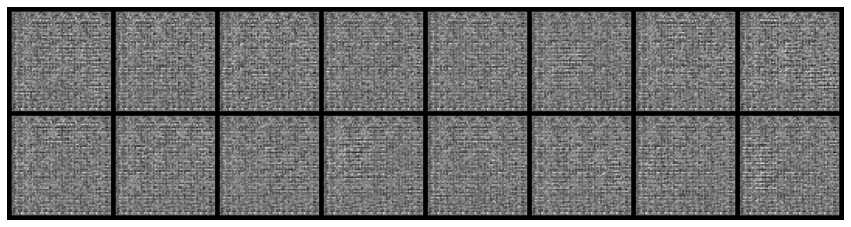

Epoch 11/100, time: 9.14799690246582s
Discriminator loss: 1.2746342420578003, Generator loss: 0.8417487144470215
--------------------------------------------------------------------------------
Epoch 12/100, time: 9.148000001907349s
Discriminator loss: 1.0114580392837524, Generator loss: 1.031977891921997
--------------------------------------------------------------------------------
Epoch 13/100, time: 9.182999849319458s
Discriminator loss: 1.0370147228240967, Generator loss: 1.0867341756820679
--------------------------------------------------------------------------------
Epoch 14/100, time: 9.087001323699951s
Discriminator loss: 1.001128077507019, Generator loss: 1.0244739055633545
--------------------------------------------------------------------------------
Epoch 15/100, time: 9.25003981590271s
Discriminator loss: 0.7864596843719482, Generator loss: 1.2026946544647217
--------------------------------------------------------------------------------
Epoch 16/100, time: 9.2010397

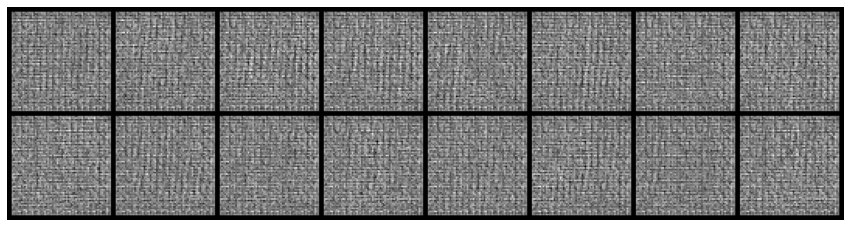

Epoch 21/100, time: 9.049999713897705s
Discriminator loss: 0.6367773413658142, Generator loss: 0.926133930683136
--------------------------------------------------------------------------------
Epoch 22/100, time: 9.184488534927368s
Discriminator loss: 0.523780107498169, Generator loss: 0.8051093220710754
--------------------------------------------------------------------------------
Epoch 23/100, time: 9.117746591567993s
Discriminator loss: 0.7666758298873901, Generator loss: 0.8119335174560547
--------------------------------------------------------------------------------
Epoch 24/100, time: 9.171996116638184s
Discriminator loss: 0.5566022396087646, Generator loss: 0.6876399517059326
--------------------------------------------------------------------------------
Epoch 25/100, time: 9.015998840332031s
Discriminator loss: 0.661733090877533, Generator loss: 0.7839371562004089
--------------------------------------------------------------------------------
Epoch 26/100, time: 9.045552

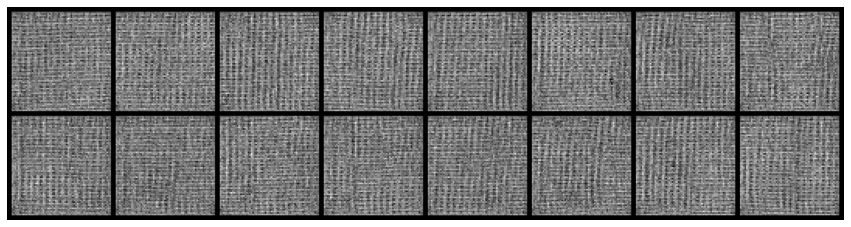

Epoch 31/100, time: 9.155999422073364s
Discriminator loss: 0.7679283618927002, Generator loss: 0.7694560289382935
--------------------------------------------------------------------------------
Epoch 32/100, time: 9.13599944114685s
Discriminator loss: 0.6287109851837158, Generator loss: 0.8848028182983398
--------------------------------------------------------------------------------
Epoch 33/100, time: 9.107532501220703s
Discriminator loss: 0.5794758796691895, Generator loss: 0.8473120927810669
--------------------------------------------------------------------------------
Epoch 34/100, time: 9.15800142288208s
Discriminator loss: 0.5977795124053955, Generator loss: 0.7899048328399658
--------------------------------------------------------------------------------
Epoch 35/100, time: 9.267999410629272s
Discriminator loss: 0.6230810880661011, Generator loss: 0.7953888177871704
--------------------------------------------------------------------------------
Epoch 36/100, time: 9.08599

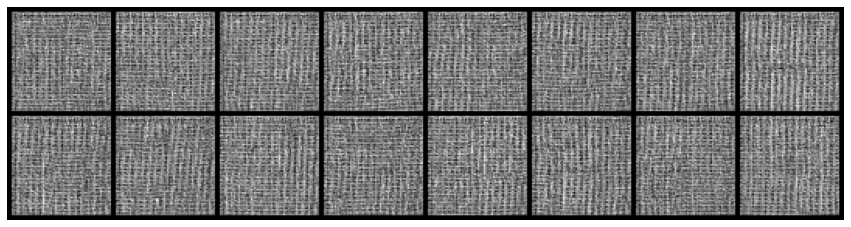

Epoch 41/100, time: 9.15299940109253s
Discriminator loss: 0.5799820423126221, Generator loss: 0.8733679056167603
--------------------------------------------------------------------------------
Epoch 42/100, time: 9.12999963760376s
Discriminator loss: 0.5776005983352661, Generator loss: 0.8385069370269775
--------------------------------------------------------------------------------
Epoch 43/100, time: 9.239001035690308s
Discriminator loss: 0.5475030541419983, Generator loss: 0.7790017127990723
--------------------------------------------------------------------------------
Epoch 44/100, time: 9.151000261306763s
Discriminator loss: 0.3961382806301117, Generator loss: 0.6580376029014587
--------------------------------------------------------------------------------
Epoch 45/100, time: 9.187999486923218s
Discriminator loss: 0.3824300169944763, Generator loss: 0.6682369709014893
--------------------------------------------------------------------------------
Epoch 46/100, time: 9.13300

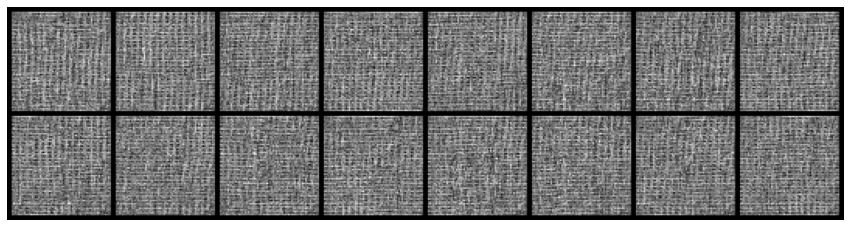

Epoch 51/100, time: 9.039997577667236s
Discriminator loss: 0.3575837016105652, Generator loss: 0.9342654943466187
--------------------------------------------------------------------------------
Epoch 52/100, time: 9.329999685287476s
Discriminator loss: 0.2738908529281616, Generator loss: 1.0020358562469482
--------------------------------------------------------------------------------
Epoch 53/100, time: 9.154999017715454s
Discriminator loss: 0.27234533429145813, Generator loss: 0.7651684284210205
--------------------------------------------------------------------------------
Epoch 54/100, time: 9.037035703659058s
Discriminator loss: 0.2748315632343292, Generator loss: 0.7761679887771606
--------------------------------------------------------------------------------
Epoch 55/100, time: 9.0179603099823s
Discriminator loss: 0.2889914810657501, Generator loss: 0.8582455515861511
--------------------------------------------------------------------------------
Epoch 56/100, time: 9.1280

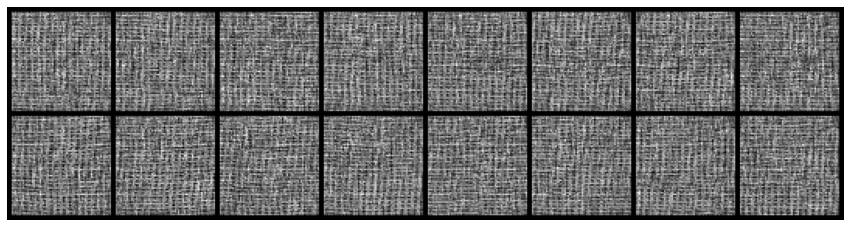

Epoch 61/100, time: 9.03499960899353s
Discriminator loss: 0.210879385471344, Generator loss: 1.104993462562561
--------------------------------------------------------------------------------
Epoch 62/100, time: 9.140999555587769s
Discriminator loss: 0.258720338344574, Generator loss: 0.9085924625396729
--------------------------------------------------------------------------------
Epoch 63/100, time: 9.107998371124268s
Discriminator loss: 0.16364407539367676, Generator loss: 1.0337069034576416
--------------------------------------------------------------------------------
Epoch 64/100, time: 9.085990905761719s
Discriminator loss: 0.22004416584968567, Generator loss: 1.7330186367034912
--------------------------------------------------------------------------------
Epoch 65/100, time: 9.10699987411499s
Discriminator loss: 0.1703907698392868, Generator loss: 1.1278150081634521
--------------------------------------------------------------------------------
Epoch 66/100, time: 9.177001

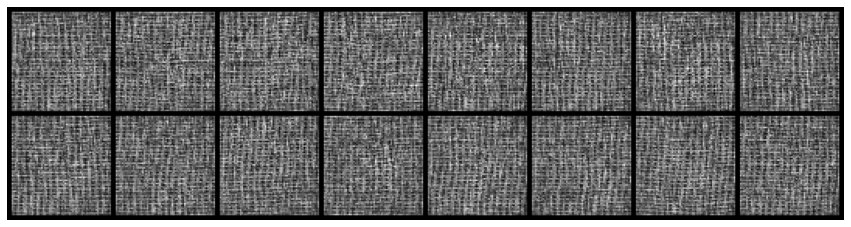

Epoch 71/100, time: 9.059042692184448s
Discriminator loss: 0.15099617838859558, Generator loss: 1.2433133125305176
--------------------------------------------------------------------------------
Epoch 72/100, time: 9.35400128364563s
Discriminator loss: 0.20020046830177307, Generator loss: 1.00031316280365
--------------------------------------------------------------------------------
Epoch 73/100, time: 9.242993116378784s
Discriminator loss: 0.1955185830593109, Generator loss: 1.755270004272461
--------------------------------------------------------------------------------
Epoch 74/100, time: 9.118035793304443s
Discriminator loss: 0.17911836504936218, Generator loss: 1.2031991481781006
--------------------------------------------------------------------------------
Epoch 75/100, time: 9.102039575576782s
Discriminator loss: 0.17342986166477203, Generator loss: 1.1565420627593994
--------------------------------------------------------------------------------
Epoch 76/100, time: 9.018

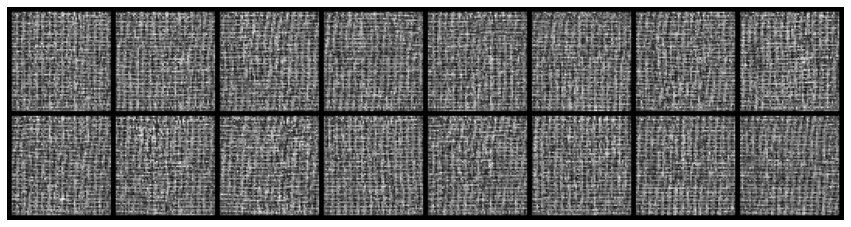

Epoch 81/100, time: 9.015066623687744s
Discriminator loss: 0.1396258920431137, Generator loss: 1.4950778484344482
--------------------------------------------------------------------------------
Epoch 82/100, time: 9.03400206565857s
Discriminator loss: 0.12481538951396942, Generator loss: 1.5943653583526611
--------------------------------------------------------------------------------
Epoch 83/100, time: 9.02699899673462s
Discriminator loss: 0.12380371987819672, Generator loss: 1.9279381036758423
--------------------------------------------------------------------------------
Epoch 84/100, time: 9.00600004196167s
Discriminator loss: 0.1567741483449936, Generator loss: 1.495478868484497
--------------------------------------------------------------------------------
Epoch 85/100, time: 9.039000988006592s
Discriminator loss: 0.1508086919784546, Generator loss: 1.3623013496398926
--------------------------------------------------------------------------------
Epoch 86/100, time: 9.27099

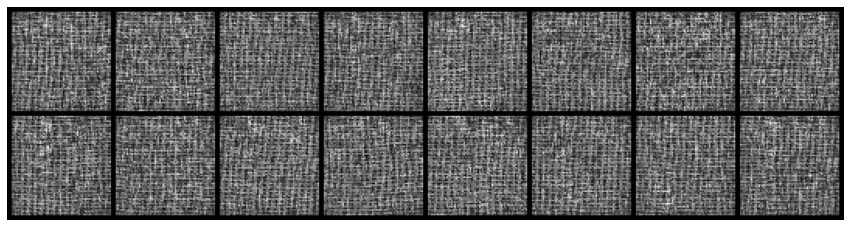

Epoch 91/100, time: 9.183995723724365s
Discriminator loss: 0.11438556760549545, Generator loss: 1.4768199920654297
--------------------------------------------------------------------------------
Epoch 92/100, time: 9.158000230789185s
Discriminator loss: 0.0910147875547409, Generator loss: 1.9107263088226318
--------------------------------------------------------------------------------
Epoch 93/100, time: 9.29900050163269s
Discriminator loss: 0.10947485268115997, Generator loss: 1.854837417602539
--------------------------------------------------------------------------------
Epoch 94/100, time: 9.123000144958496s
Discriminator loss: 0.07932855933904648, Generator loss: 2.066577434539795
--------------------------------------------------------------------------------
Epoch 95/100, time: 9.172998428344727s
Discriminator loss: 0.07232440263032913, Generator loss: 2.0628273487091064
--------------------------------------------------------------------------------
Epoch 96/100, time: 9.16

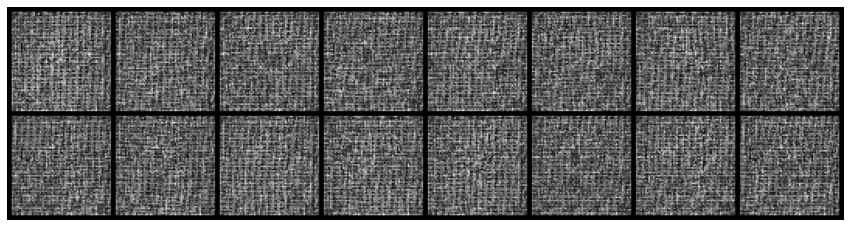

Total time for training is 915.1470699310303s


In [19]:
# train gan
generator.train()
discriminator.train()
# create losses list
d_loss_list, g_loss_list = [], []
# get start time
start_time = time.time()
# n_epochs 만큼 훈련 진행
for epoch in tqdm(range(n_epochs)):
    # get start time of each epoch
    initial_epoch_time = time.time()
    # train every batch
    for _, X_batch in enumerate(dataloader):
        """ train discriminator model """
        dis_optim.zero_grad()
        # step1: 판별자에 진짜 이미지를 입력, 라벨 생성
        X_real = X_batch.to(device)
        real_output = discriminator(X_real)
        real_label = torch.ones_like(real_output, device=device)
        # step2: 랜덤 노이즈 생성 32x128x1x1
        z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        # step3: 가짜 이미지를 생성하고 판별자에 입력
        X_fake = generator(z)
        fake_output = discriminator(X_fake)
        fake_label = torch.zeros_like(fake_output, device=device)
        # step4: 진짜 이미지와 가짜 이미지 로스를 구하고 옵티마이저 업데이트
        real_loss = loss_func(real_output, real_label)
        fake_loss = loss_func(fake_output, fake_label)
        d_loss = real_loss+fake_loss
        d_loss.backward()
        dis_optim.step()
        
        """ train generator model """
        for _ in range(2):
            gen_optim.zero_grad()
            # step1: 가짜 이미지 생성 후 판별자에 입력
            X_fake = generator(z)
            fake_output = discriminator(X_fake)
            # step2: 판별자를 속이기 위한 가짜 라벨 생성
            gen_label = torch.ones_like(fake_output, device=device)
            # step3: 로스 구하기 및 옵티마이저 업데이트
            g_loss = loss_func(fake_output, gen_label)
            g_loss.backward()
            gen_optim.step()
        
    d_loss_list.append(d_loss.item())
    g_loss_list.append(g_loss.item())
    # get end time of each epoch
    end_epoch_time = time.time()
    epoch_time = end_epoch_time-initial_epoch_time
    # print number of epoch and time and losses
    print(f'Epoch {epoch+1}/{n_epochs}, time: {epoch_time}s\n'
          f'Discriminator loss: {d_loss}, Generator loss: {g_loss}')
    print('--------------------------------------------------------------------------------')
    # plot generated images
    plot_generated_images(X_fake, epoch+1, 10)
end_time = time.time()
print(f'Total time for training is {end_time-start_time}s')

### Check Result of generated images

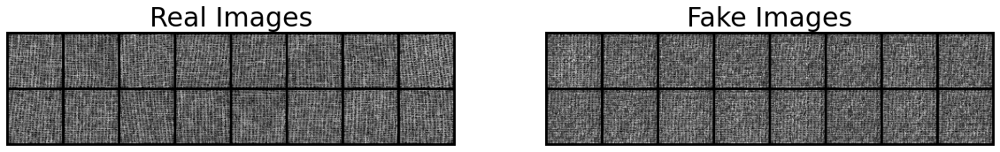

In [20]:
# compare with real images and generated images
plt.figure(figsize=(20,6))
plt.subplot(121)
# real images
real_images = np.transpose(vutils.make_grid(X_real.to(device),
                                            padding=3,
                                            normalize=True).cpu(), (1,2,0))
plt.imshow(real_images)
plt.axis('off')
plt.title('Real Images', size=30)
plt.subplot(122)
# fake images
fake_images = np.transpose(vutils.make_grid(X_fake.to(device),
                                            padding=3,
                                            normalize=True).cpu(), (1,2,0))
plt.imshow(fake_images)
plt.axis('off')
plt.title('Fake Images', size=30)
plt.show()

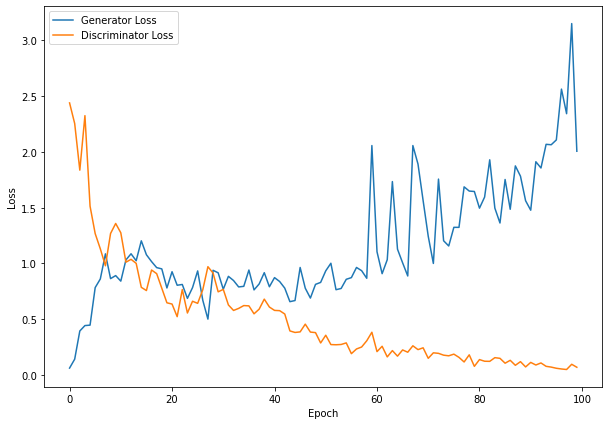

In [21]:
# check losses of networks
plt.figure(figsize=(10,7))
plt.plot(g_loss_list, label='Generator Loss')
plt.plot(d_loss_list, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()

### Train latent Z and Compare anomaly score

In [22]:
# residual loss (real image와 fake image의 시각적 차이를 측정)
def residual_loss(real_image, fake_image):
    loss = real_image-fake_image
    return torch.sum(torch.abs(loss))

# discriminator loss (feature map의 차이를 확인)
def discriminator_loss(real_image, fake_image):
    y_real = discriminator.extract_feature(real_image)
    y_fake = discriminator.extract_feature(fake_image)
    return torch.sum(torch.abs(y_real-y_fake))

# anomaly loss (위의 residual loss와 discriminator loss의 weighted 합)
# 이를 anomaly score로도 쓸 것임 (어차피 식이 똑같은 의미를 지니기 때문에)
def anomaly_loss(residual_loss, discriminator_loss, lambda_=0.1):
    loss = (1-lambda_)*residual_loss+lambda_*discriminator_loss
    return loss

In [23]:
# load anomalies and normal test set
target_size = target_size
batch_size = 1

transforms_ = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5)),
    transforms.Resize(target_size),
])

In [26]:
# load nomrmal set
test_dir = './anogan_carpet_target/'

test_folder = ImageFolder(test_dir,
                          transform=transforms_,
                          target_transform=None)

test_loader = DataLoader(test_folder,
                         batch_size=batch_size,
                         shuffle=True,
                         drop_last=True)

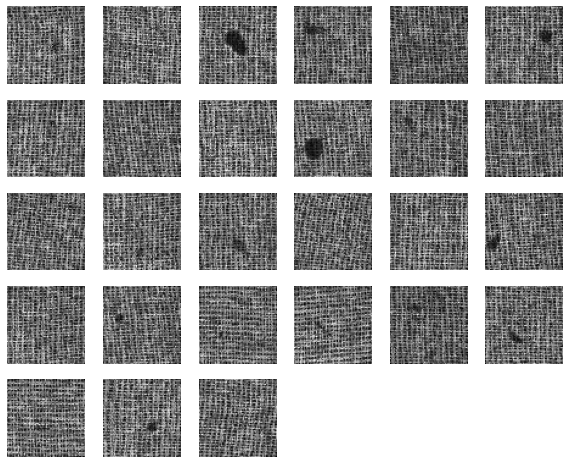

In [27]:
def show_samples(dataloader):
    n = int(np.ceil(np.sqrt(len(dataloader))))
    plt.figure(figsize=(10,10))
    for i, [image, _] in enumerate(dataloader):
        img = np.transpose(image[0], (1,2,0))
        plt.subplot(n,n,i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    plt.show()
    
show_samples(test_loader)

In [28]:
# latent vector Z를 훈련시키는 함수 정의
def train_latent_space(dataloader):
    # set Z and optimizer
    z = torch.randn(batch_size, latent_dim, 1, 1, device=device, requires_grad=True)
    optimizer_z = optim.Adam([z], lr=lr)
    
    latent_space = []
    anomaly_score = []
    
    for i, [image, _] in tqdm(enumerate(dataloader)):
        real_image = image.to(device)
        
        for step in range(10000):
            optimizer_z.zero_grad()
            # step1: 가짜 이미지 생성
            fake_image = generator(z)
            # step2: loss들 구하기
            res_loss = residual_loss(real_image, fake_image)
            dis_loss = discriminator_loss(real_image, fake_image)
            ano_loss = anomaly_loss(res_loss, dis_loss, lambda_=0.1)
            # step3: loss 및 optimizer 업데이트
            ano_loss.backward(retain_graph=True)
            optimizer_z.step()
            # print number of step and show losses
            if (step+1)%1000==0:
                print(f'{i+1} image, step [{step+1}]\n'
                      f'residual loss: {res_loss.item():.5}  '
                      f'discrimination loss: {dis_loss.item():.5}  '
                      f'anomaly loss: {ano_loss.item():.5}')
        latent_space.append(z.detach().cpu().numpy())
        anomaly_score.append(ano_loss.detach().cpu().numpy())
    
    return np.array(latent_space), np.array(anomaly_score)

In [30]:
# train Z about normal data
latent_space, anomaly_score = train_latent_space(test_loader)

0it [00:00, ?it/s]

1 image, step [1000]
residual loss: 1213.9  discrimination loss: 2507.4  anomaly loss: 1343.2
1 image, step [2000]
residual loss: 1170.1  discrimination loss: 2390.1  anomaly loss: 1292.1
1 image, step [3000]
residual loss: 1131.1  discrimination loss: 2324.4  anomaly loss: 1250.4
1 image, step [4000]
residual loss: 1110.6  discrimination loss: 2297.1  anomaly loss: 1229.3
1 image, step [5000]
residual loss: 1096.0  discrimination loss: 2265.4  anomaly loss: 1212.9
1 image, step [6000]
residual loss: 1087.6  discrimination loss: 2237.0  anomaly loss: 1202.5
1 image, step [7000]
residual loss: 1080.0  discrimination loss: 2204.6  anomaly loss: 1192.5
1 image, step [8000]
residual loss: 1073.0  discrimination loss: 2179.4  anomaly loss: 1183.6
1 image, step [9000]
residual loss: 1066.2  discrimination loss: 2153.1  anomaly loss: 1174.8
1 image, step [10000]
residual loss: 1059.6  discrimination loss: 2140.4  anomaly loss: 1167.7
2 image, step [1000]
residual loss: 1194.6  discrimination 

9 image, step [9000]
residual loss: 1016.0  discrimination loss: 2152.1  anomaly loss: 1129.6
9 image, step [10000]
residual loss: 1012.9  discrimination loss: 2144.3  anomaly loss: 1126.0
10 image, step [1000]
residual loss: 1215.4  discrimination loss: 2442.8  anomaly loss: 1338.1
10 image, step [2000]
residual loss: 1174.8  discrimination loss: 2324.6  anomaly loss: 1289.8
10 image, step [3000]
residual loss: 1139.3  discrimination loss: 2149.8  anomaly loss: 1240.4
10 image, step [4000]
residual loss: 1117.3  discrimination loss: 2039.4  anomaly loss: 1209.5
10 image, step [5000]
residual loss: 1105.6  discrimination loss: 2007.7  anomaly loss: 1195.8
10 image, step [6000]
residual loss: 1096.6  discrimination loss: 1986.4  anomaly loss: 1185.6
10 image, step [7000]
residual loss: 1090.0  discrimination loss: 1970.4  anomaly loss: 1178.1
10 image, step [8000]
residual loss: 1084.3  discrimination loss: 1957.9  anomaly loss: 1171.7
10 image, step [9000]
residual loss: 1078.8  discri

18 image, step [6000]
residual loss: 1150.4  discrimination loss: 2446.5  anomaly loss: 1280.0
18 image, step [7000]
residual loss: 1142.2  discrimination loss: 2400.2  anomaly loss: 1268.0
18 image, step [8000]
residual loss: 1135.0  discrimination loss: 2381.1  anomaly loss: 1259.6
18 image, step [9000]
residual loss: 1130.6  discrimination loss: 2370.2  anomaly loss: 1254.5
18 image, step [10000]
residual loss: 1128.4  discrimination loss: 2363.1  anomaly loss: 1251.9
19 image, step [1000]
residual loss: 1082.6  discrimination loss: 2125.0  anomaly loss: 1186.8
19 image, step [2000]
residual loss: 1056.9  discrimination loss: 2043.7  anomaly loss: 1155.6
19 image, step [3000]
residual loss: 1022.5  discrimination loss: 1955.1  anomaly loss: 1115.8
19 image, step [4000]
residual loss: 1003.8  discrimination loss: 1910.2  anomaly loss: 1094.5
19 image, step [5000]
residual loss: 992.77  discrimination loss: 1876.7  anomaly loss: 1081.2
19 image, step [6000]
residual loss: 984.57  disc

27 image, step [3000]
residual loss: 1018.1  discrimination loss: 2172.2  anomaly loss: 1133.5
27 image, step [4000]
residual loss: 1011.3  discrimination loss: 2149.5  anomaly loss: 1125.1
27 image, step [5000]
residual loss: 1007.4  discrimination loss: 2126.4  anomaly loss: 1119.3
27 image, step [6000]
residual loss: 1005.7  discrimination loss: 2118.4  anomaly loss: 1116.9
27 image, step [7000]
residual loss: 1004.1  discrimination loss: 2114.9  anomaly loss: 1115.2
27 image, step [8000]
residual loss: 1003.7  discrimination loss: 2112.1  anomaly loss: 1114.5
27 image, step [9000]
residual loss: 1003.2  discrimination loss: 2109.7  anomaly loss: 1113.8
27 image, step [10000]
residual loss: 1002.8  discrimination loss: 2107.2  anomaly loss: 1113.3


In [31]:
# array 변환
latent_space = np.array(latent_space)
anomaly_score = np.array(anomaly_score)

In [32]:
# 이미지를 입력하면 anomaly score가 출력되는 함수 생성
def compute_anomaly_score(input_image, z):
    input_image = input_image.to(device)
    z = z.to(device)
    fake_image = generator(z)
    feature_extract = discriminator.extract_feature(input_image)
    res_loss = residual_loss(input_image, fake_image)
    dis_loss = discriminator_loss(input_image, fake_image)
    ano_score = anomaly_loss(res_loss, dis_loss, lambda_=0.1)
    return ano_score, fake_image

In [33]:
# 이미지를 torch tensor gpu 버전에서 numpy array로 변환 및 [0,1] 스케일링 해주는 함수
def torch_to_array(image, add=False):
    if add==False:
        img = (image+1)/2
    else:
        img = (image-image.min())/(image-image.min()).max()
    img = np.transpose(img.detach().cpu().numpy(), (1,2,0))
    return img

In [34]:
# anomaly score 및 anomaly 부분 detection 시각화 함수
def compare_images(input_image, z, reverse):
    real_image = input_image.to(device)
    score, fake_image = compute_anomaly_score(input_image, z)
    
    if not reverse:
        diff_image = real_image-fake_image
    else:
        diff_image = fake_image-real_image
        
    real_image = real_image.reshape(1,64,64)
    fake_image = fake_image.reshape(1,64,64)
    diff_image = diff_image.reshape(1,64,64)
    
    anomaly_image = torch.zeros(size=(3,64,64), device=device)
    anomaly_image[0,:,:] = real_image-diff_image
    anomaly_image[1,:,:] = real_image-diff_image
    anomaly_image[2,:,:] = real_image-diff_image
    anomaly_image[0,:,:] = anomaly_image[0,:,:]+diff_image
    
    fig, axes = plt.subplots(1,4, figsize=(15,4))
    fig.suptitle(f'Anomaly score {score.item():.6}', size=20)
    axes[0].imshow(torch_to_array(real_image), cmap='gray')
    axes[0].axis('off')
    axes[0].set_title('Input Image')
    axes[1].imshow(torch_to_array(fake_image), cmap='gray')
    axes[1].axis('off')
    axes[1].set_title('Generated Image')
    axes[2].imshow(torch_to_array(diff_image, add=True), cmap='gray')
    axes[2].axis('off')
    axes[2].set_title('Difference')
    axes[3].imshow(torch_to_array(anomaly_image, add=True))
    axes[3].axis('off')
    axes[3].set_title('Anomaly Image')

In [35]:
def show_image_score(dataloader, latent_z):
    for i, [image, _] in enumerate(dataloader):
        image = image.to(device)
        update_z = torch.Tensor(latent_z[i]).to(device)
        
        compare_images(image, update_z, reverse=True)

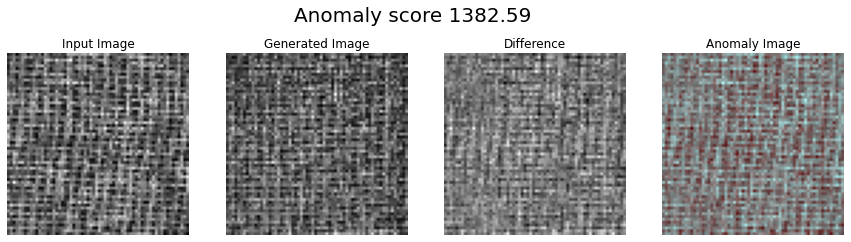

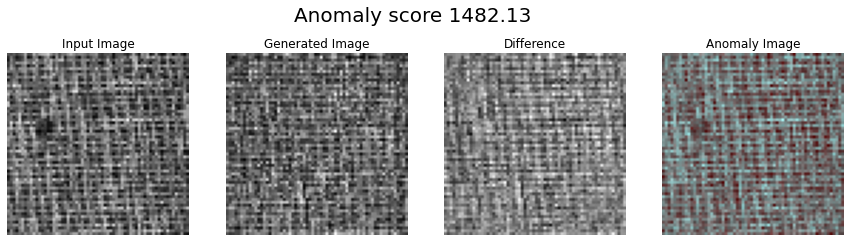

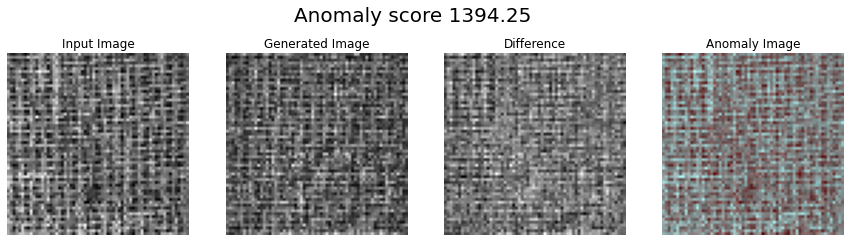

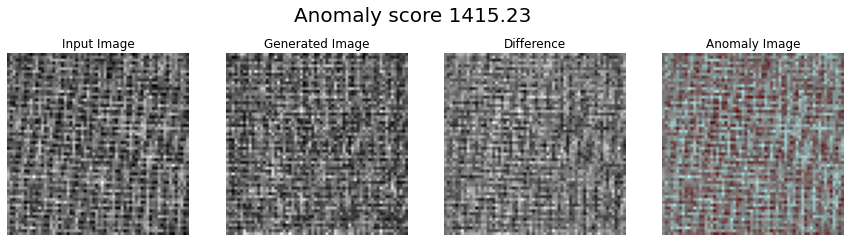

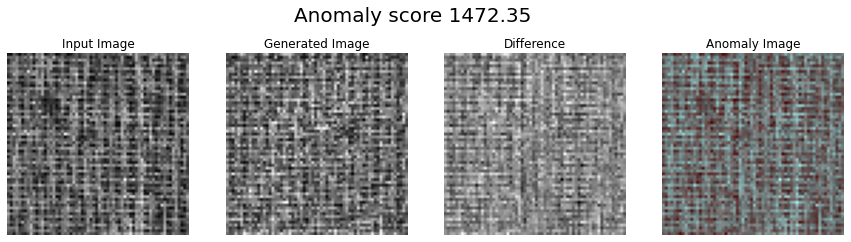

...

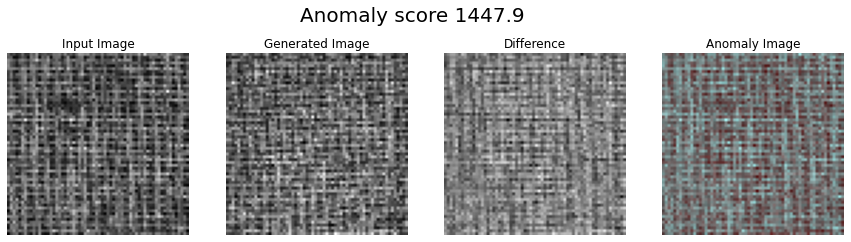

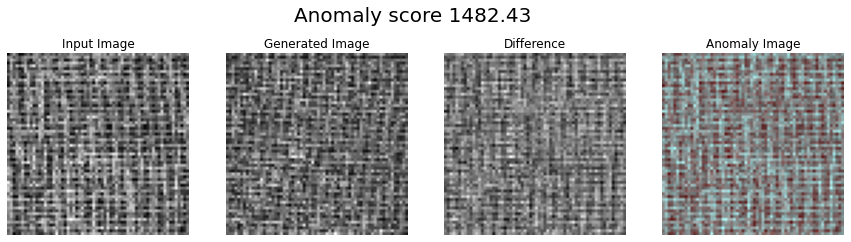

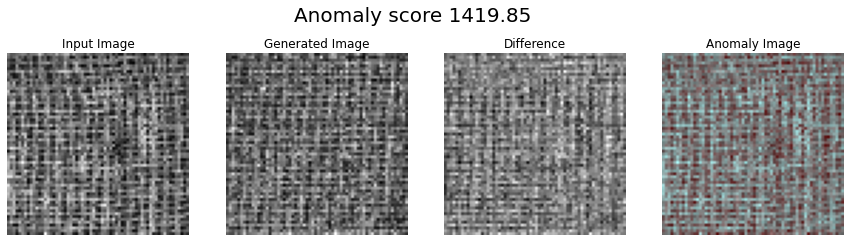

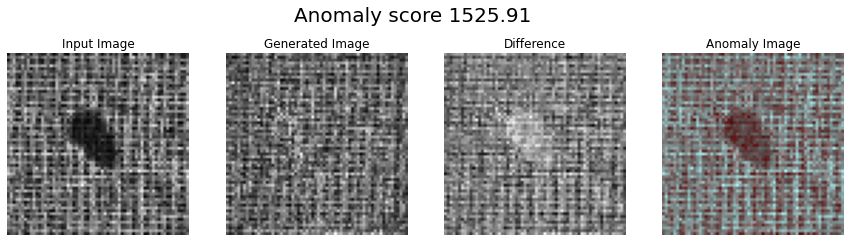

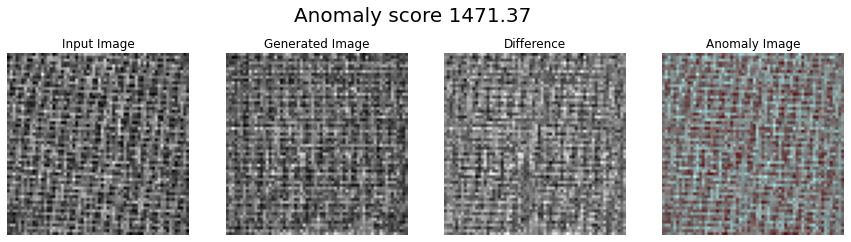

In [37]:
show_image_score(test_loader, latent_space)